<a href="https://colab.research.google.com/github/emreakbulut06/SayisalGoruntuIsleme_Final/blob/main/FinalOdevi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import seaborn as sns
sns.set()

In [3]:
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 29.72 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


In [4]:
%ls nih/

densenet.hdf5  images_small/  pretrained_model.h5  test.csv  train-small.csv  valid-small.csv


In [5]:
data_path = os.path.join(os.getcwd(), 'nih')

In [6]:
# Klasör içeriğini görüntüleyelim
!ls {data_path}

densenet.hdf5  images_small  pretrained_model.h5  test.csv  train-small.csv  valid-small.csv


In [7]:
# Veri dosyasını okuyalım
train_df = pd.read_csv(os.path.join(data_path, "train-small.csv"))

Display Random Images


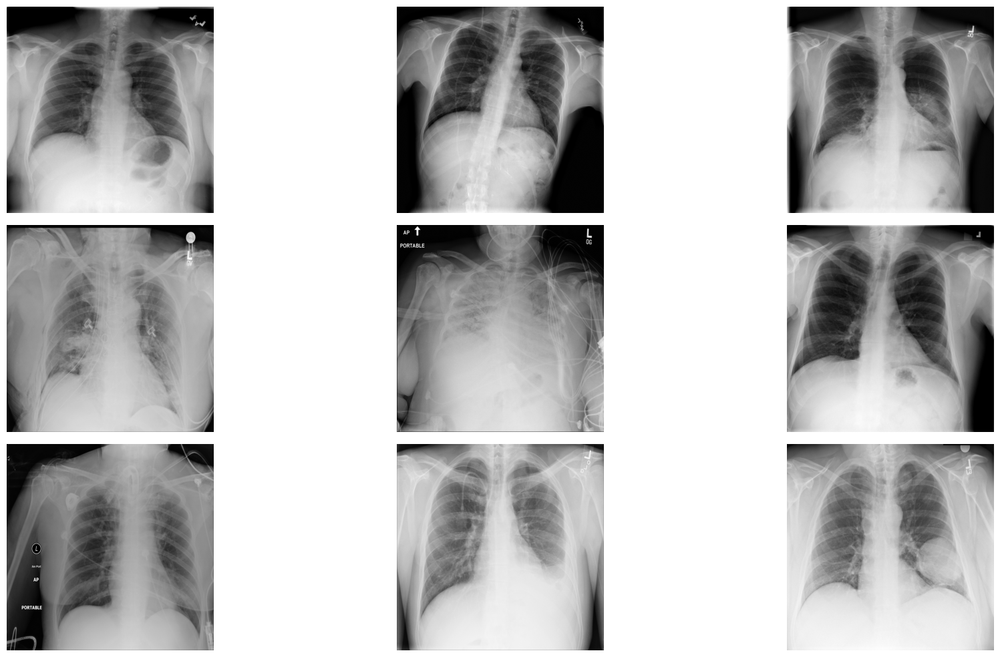

In [8]:
# Extract numpy values from Image column in data frame
images = train_df['Image'].values

# Extract 9 random images from it
random_images = [np.random.choice(images) for i in range(9)]

# Location of the image dir
img_dir = 'nih/images_small/'

print('Display Random Images')

# Adjust the size of your images
plt.figure(figsize=(20,10))

# Iterate and plot random images
for i in range(9):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()

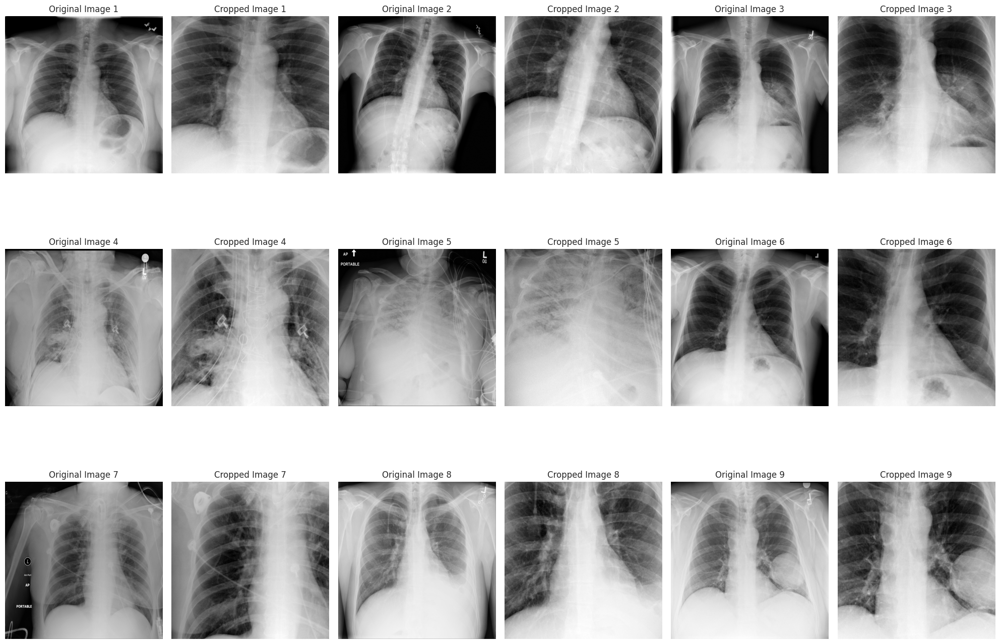

In [9]:
# Görüntüleri kırpmak ve görselleştirmek için döngü
plt.figure(figsize=(20,15))

# 9 rastgele seçilen görüntü üzerinde işlem yapalım
for i in range(9):
    # Görüntüyü okuma
    img = plt.imread(os.path.join(img_dir, random_images[i]))

    # Görüntü boyutlarını alıyoruz
    height, width = img.shape[:2]

    # Akciğerin merkezi bölgesine odaklanarak kırpma (yaklaşık değerler)
    crop_height = int(height * 0.6)
    crop_width = int(width * 0.6)

    # Merkezi bölgeyi seçiyoruz
    x_center = width // 2
    y_center = height // 2

    x1 = x_center - crop_width // 2
    y1 = y_center - crop_height // 2
    x2 = x_center + crop_width // 2
    y2 = y_center + crop_height // 2

    # Kırpılmış görüntü
    cropped_img = img[y1:y2, x1:x2]

    # Görüntüleri görselleştirme
    plt.subplot(3, 6, 2*i + 1)  # Orijinal görüntü
    plt.imshow(img, cmap='gray')
    plt.title(f'Original Image {i+1}')
    plt.axis('off')

    plt.subplot(3, 6, 2*i + 2)  # Kırpılmış görüntü
    plt.imshow(cropped_img, cmap='gray')
    plt.title(f'Cropped Image {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

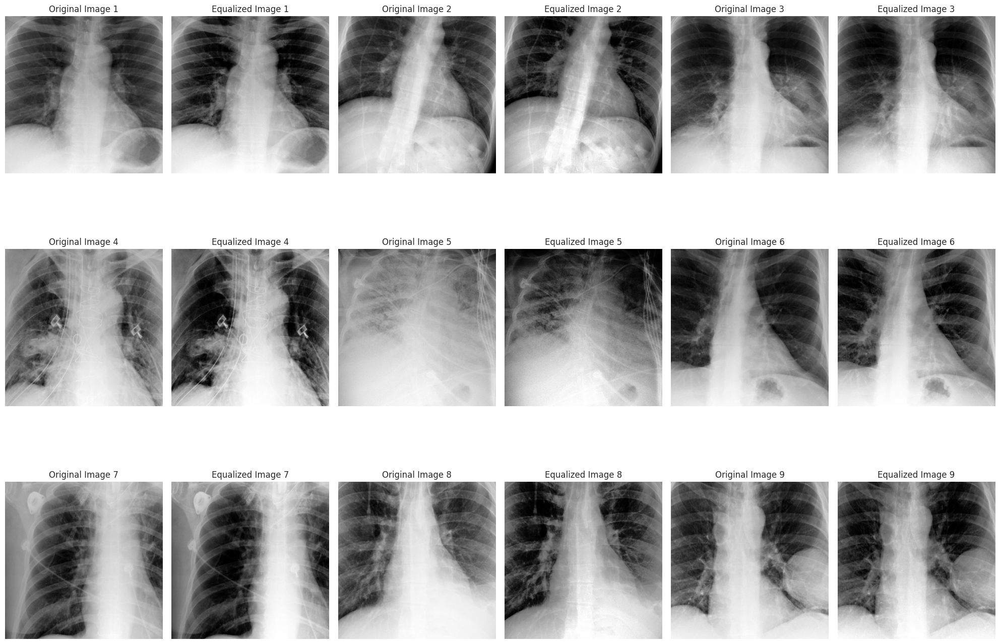

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntüleri görselleştirmek için ayarlamalar
plt.figure(figsize=(20,15))

# 9 rastgele seçilen görüntü üzerinde işlem yapalım
for i in range(9):
    # Görüntüyü okuma
    img = plt.imread(os.path.join(img_dir, random_images[i]))

    # Görüntü boyutlarını alıyoruz
    height, width = img.shape[:2]

    # Akciğerin merkezi bölgesine odaklanarak kırpma (yaklaşık değerler)
    crop_height = int(height * 0.6)
    crop_width = int(width * 0.6)

    # Merkezi bölgeyi seçiyoruz
    x_center = width // 2
    y_center = height // 2

    x1 = x_center - crop_width // 2
    y1 = y_center - crop_height // 2
    x2 = x_center + crop_width // 2
    y2 = y_center + crop_height // 2

    # Kırpılmış görüntü
    cropped_img = img[y1:y2, x1:x2]

    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(cropped_img.shape) == 3:  # Renkli görüntü ise
        img_gray = cv2.cvtColor(cropped_img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = cropped_img  # Eğer zaten gri tonlamalıysa, direkt kullan

    # Görüntü değeri aralığını 0-255'e normalleştir
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX)

    # Görüntüyü 8-bit'e dönüştür
    img_gray = np.uint8(img_gray)

    # Histogram eşitleme işlemi
    equalized_img = cv2.equalizeHist(img_gray)

    # Görselleştirme
    plt.subplot(3, 6, 2*i + 1)  # Orijinal görüntü
    plt.imshow(cropped_img, cmap='gray')
    plt.title(f'Original Image {i+1}')
    plt.axis('off')

    plt.subplot(3, 6, 2*i + 2)  # Histogram eşitlenmiş görüntü
    plt.imshow(equalized_img, cmap='gray')
    plt.title(f'Equalized Image {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

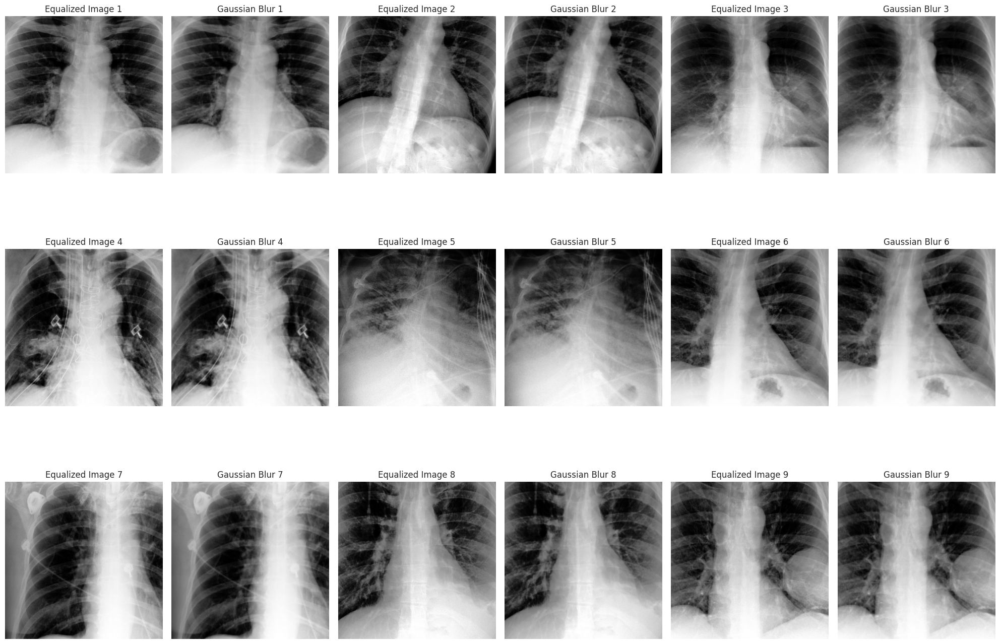

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntüleri görselleştirmek için ayarlamalar
plt.figure(figsize=(20,15))

# 9 rastgele seçilen görüntü üzerinde işlem yapalım
for i in range(9):
    # Görüntüyü okuma
    img = plt.imread(os.path.join(img_dir, random_images[i]))

    # Görüntü boyutlarını alıyoruz
    height, width = img.shape[:2]

    # Akciğerin merkezi bölgesine odaklanarak kırpma (yaklaşık değerler)
    crop_height = int(height * 0.6)
    crop_width = int(width * 0.6)

    # Merkezi bölgeyi seçiyoruz
    x_center = width // 2
    y_center = height // 2

    x1 = x_center - crop_width // 2
    y1 = y_center - crop_height // 2
    x2 = x_center + crop_width // 2
    y2 = y_center + crop_height // 2

    # Kırpılmış görüntü
    cropped_img = img[y1:y2, x1:x2]

    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(cropped_img.shape) == 3:  # Renkli görüntü ise
        img_gray = cv2.cvtColor(cropped_img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = cropped_img  # Eğer zaten gri tonlamalıysa, direkt kullan

    # Görüntü değeri aralığını 0-255'e normalleştir
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX)

    # Görüntüyü 8-bit'e dönüştür
    img_gray = np.uint8(img_gray)

    # Histogram eşitleme işlemi
    equalized_img = cv2.equalizeHist(img_gray)

    # Gaussian Blur uygulama (gürültü azaltma)
    gaussian_blur_img = cv2.GaussianBlur(equalized_img, (5, 5), 0)  # 5x5 Kernel

    # Görselleştirme
    plt.subplot(3, 6, 2*i + 1)  # Equalized görüntü
    plt.imshow(equalized_img, cmap='gray')
    plt.title(f'Equalized Image {i+1}')
    plt.axis('off')

    plt.subplot(3, 6, 2*i + 2)  # Gaussian Blur uygulanmış görüntü
    plt.imshow(gaussian_blur_img, cmap='gray')
    plt.title(f'Gaussian Blur {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


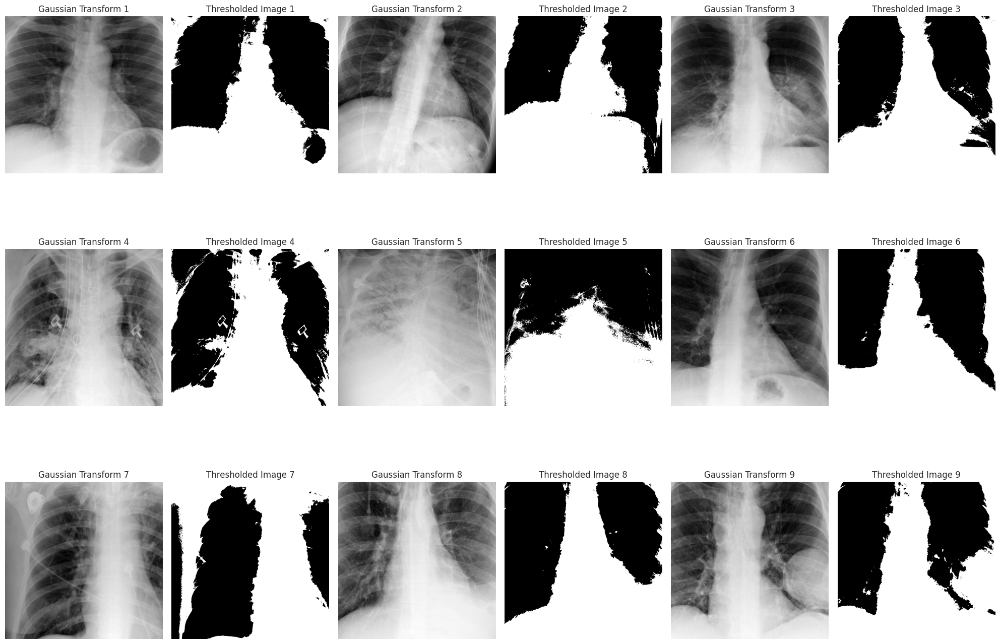

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntüleri görselleştirmek için ayarlamalar
plt.figure(figsize=(20,15))

# 9 rastgele seçilen görüntü üzerinde işlem yapalım
for i in range(9):
    # Görüntüyü okuma
    img = plt.imread(os.path.join(img_dir, random_images[i]))

    # Görüntü boyutlarını alıyoruz
    height, width = img.shape[:2]

    # Akciğerin merkezi bölgesine odaklanarak kırpma (yaklaşık değerler)
    crop_height = int(height * 0.6)
    crop_width = int(width * 0.6)

    # Merkezi bölgeyi seçiyoruz
    x_center = width // 2
    y_center = height // 2

    x1 = x_center - crop_width // 2
    y1 = y_center - crop_height // 2
    x2 = x_center + crop_width // 2
    y2 = y_center + crop_height // 2

    # Kırpılmış görüntü
    cropped_img = img[y1:y2, x1:x2]

    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(cropped_img.shape) == 3:  # Renkli görüntü ise
        img_gray = cv2.cvtColor(cropped_img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = cropped_img  # Eğer zaten gri tonlamalıysa, direkt kullan

    # Görüntü değeri aralığını 0-255'e normalleştir
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX)

    # Görüntüyü 8-bit'e dönüştür
    img_gray = np.uint8(img_gray)

    # Ortalama ve standart sapmayı hesapla
    mean, std_dev = cv2.meanStdDev(img_gray)

    # Gaussian yoğunluk dönüşümü (normalizasyon ile)
    gaussian_img = (img_gray - mean) / std_dev

    # Eşikleme işlemi: Düşük ve yüksek yoğunlukları ayırma
    # Gaussian dönüşümünden gelen değerlerle uygun bir eşik değeri kullan
    threshold_value = 0  # Ortalama değerini eşik olarak alalım
    _, thresholded_img = cv2.threshold(gaussian_img, threshold_value, 255, cv2.THRESH_BINARY)

    # Görselleştirme
    plt.subplot(3, 6, 2*i + 1)  # Gaussian dönüşümü yapılmış görüntü
    plt.imshow(gaussian_img, cmap='gray')
    plt.title(f'Gaussian Transform {i+1}')
    plt.axis('off')

    plt.subplot(3, 6, 2*i + 2)  # Eşikleme uygulanmış görüntü
    plt.imshow(thresholded_img, cmap='gray')
    plt.title(f'Thresholded Image {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen
skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen
skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen
skimage.filters.thresholding.threshold_isodata
skimage.

<Figure size 2000x1500 with 0 Axes>

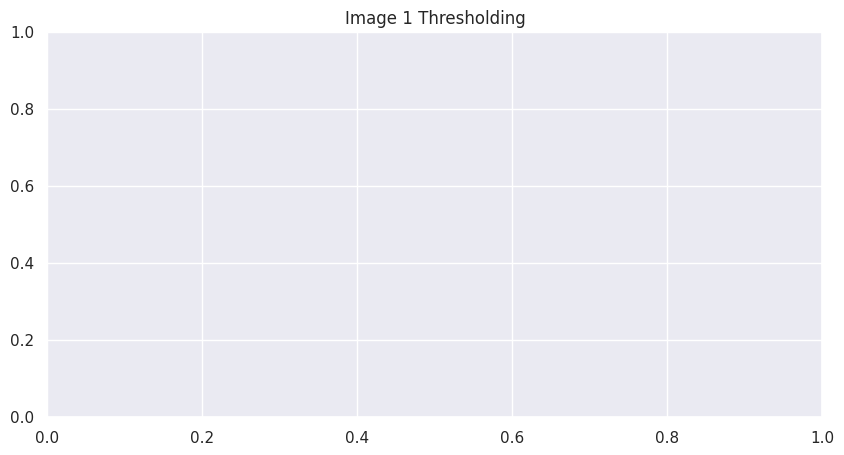

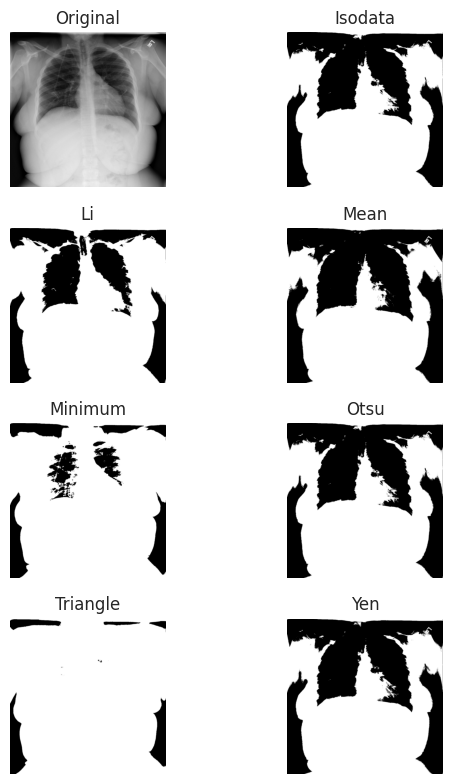

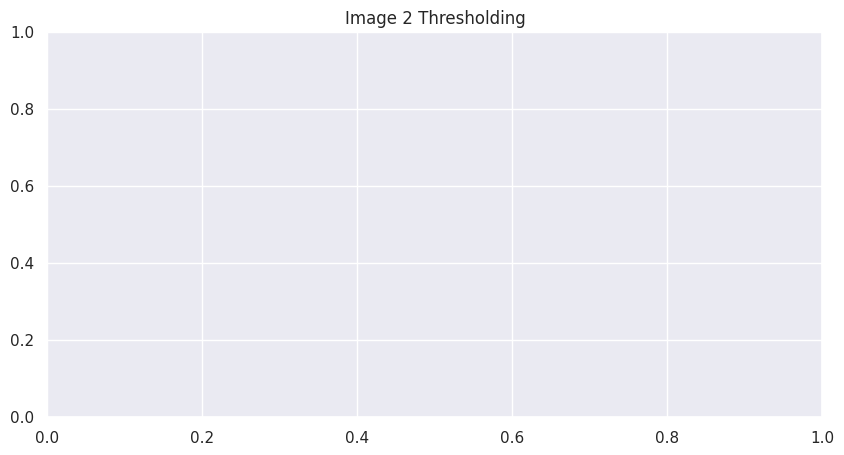

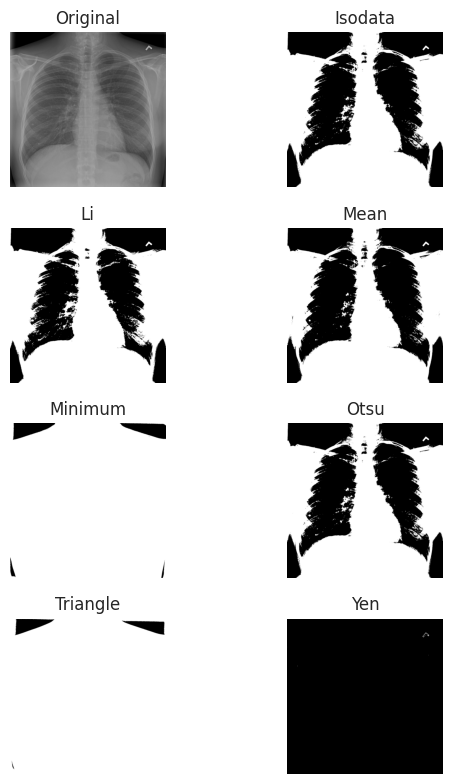

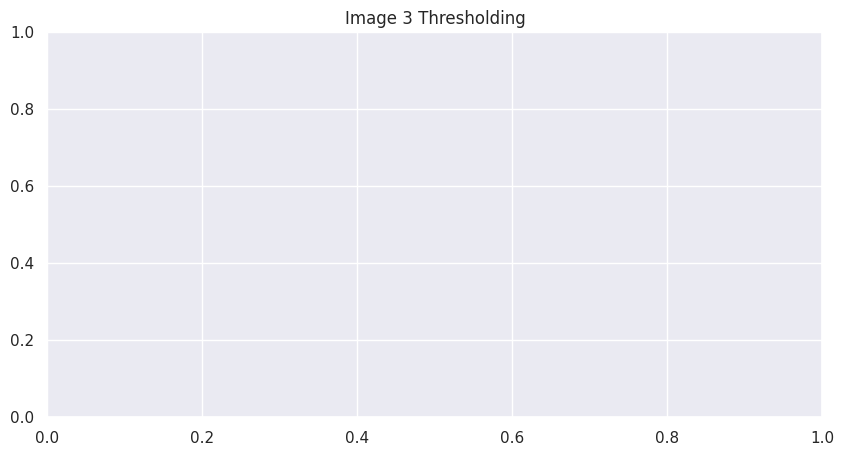

...

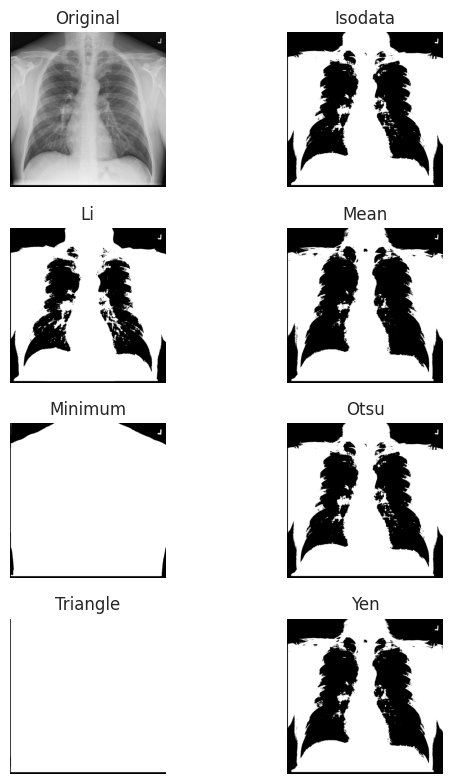

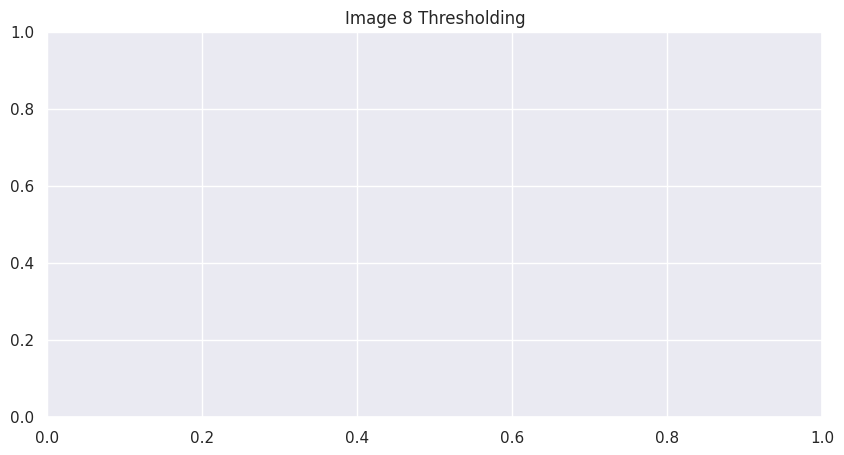

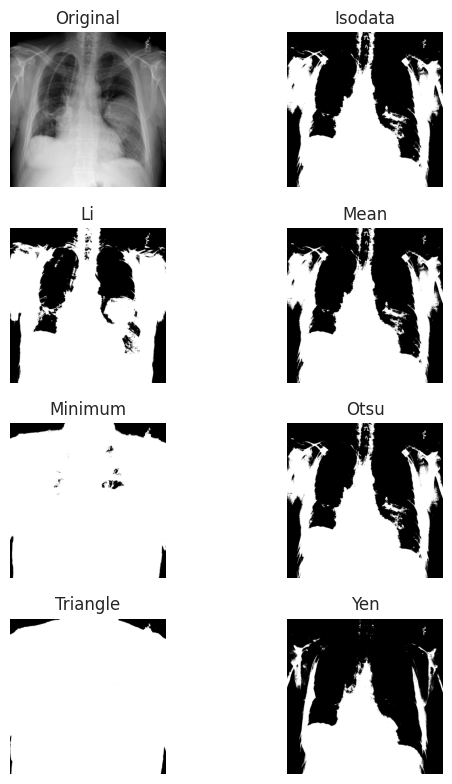

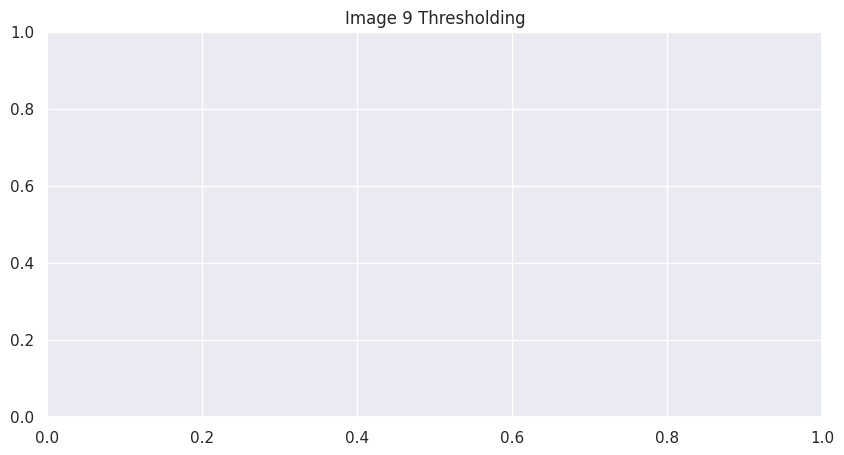

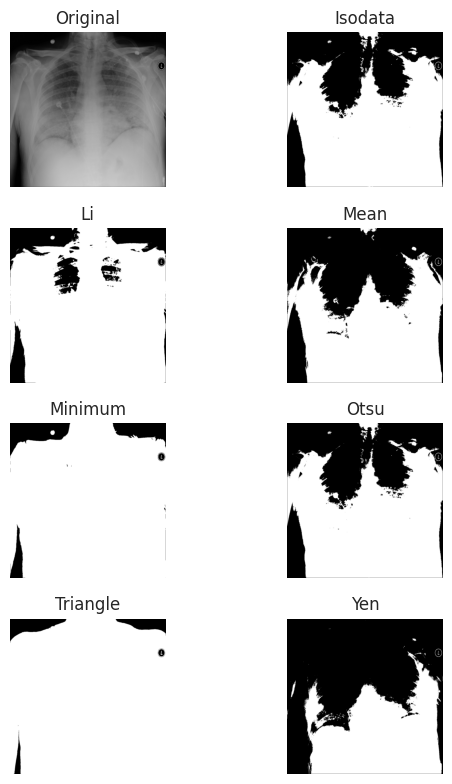

In [13]:
from skimage import io, filters
from skimage.filters import try_all_threshold
import matplotlib.pyplot as plt

# 9 rastgele seçilen resimleri al
random_images = [np.random.choice(images) for i in range(9)]

plt.figure(figsize=(20, 15))

# Görüntü üzerinde işlemi uygulayalım
for i in range(9):
    img = plt.imread(os.path.join(img_dir, random_images[i]))

    # Görüntüyü gri tonlamaya dönüştür
    if len(img.shape) == 3:  # Eğer renkli ise
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img  # Eğer zaten gri tonlamalıysa

    # Eşikleme işlemleri (thresholding)
    # `try_all_threshold` fonksiyonu birden fazla eşikleme yöntemi uygular
    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.set_title(f"Image {i+1} Thresholding")
    thresholds = try_all_threshold(img_gray, figsize=(10, 8), verbose=True)  # Eşikleme yöntemlerini uygula

    plt.tight_layout()

plt.show()

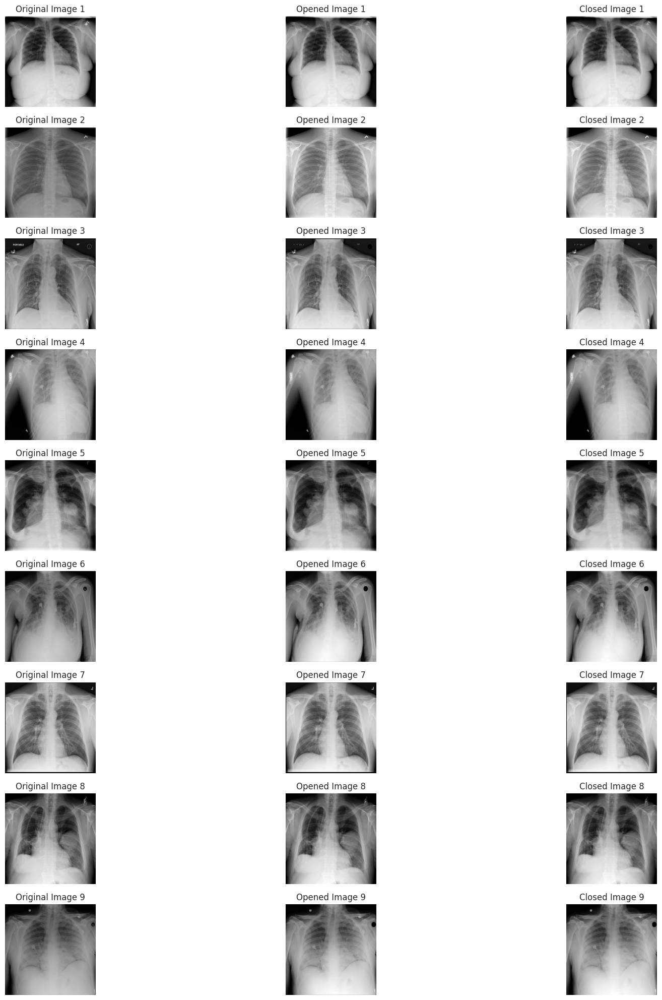

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Yapısal eleman boyutları
kernel_size = 5
structural_element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

# 9 rastgele seçilmiş görüntü üzerinde işlemleri uygulama
plt.figure(figsize=(20, 20))
for i in range(9):
    # Görüntüyü okuma ve gri tonlamaya çevirme
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img

    # Görüntü normalize edilerek uygun aralığa getiriliyor
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Morfolojik açma işlemi (noise removal için)
    opened_img = cv2.morphologyEx(img_gray, cv2.MORPH_OPEN, structural_element)

    # Morfolojik kapama işlemi (daha iyi segmentasyon için)
    closed_img = cv2.morphologyEx(opened_img, cv2.MORPH_CLOSE, structural_element)

    # Görselleştirme
    plt.subplot(9, 3, 3 * i + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f"Original Image {i+1}")
    plt.axis('off')

    plt.subplot(9, 3, 3 * i + 2)
    plt.imshow(opened_img, cmap='gray')
    plt.title(f"Opened Image {i+1}")
    plt.axis('off')

    plt.subplot(9, 3, 3 * i + 3)
    plt.imshow(closed_img, cmap='gray')
    plt.title(f"Closed Image {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


Image 1: Detected 343 connected components
Image 2: Detected 848 connected components
Image 3: Detected 354 connected components
Image 4: Detected 53 connected components
Image 5: Detected 523 connected components
Image 6: Detected 579 connected components
Image 7: Detected 338 connected components
Image 8: Detected 917 connected components
Image 9: Detected 385 connected components


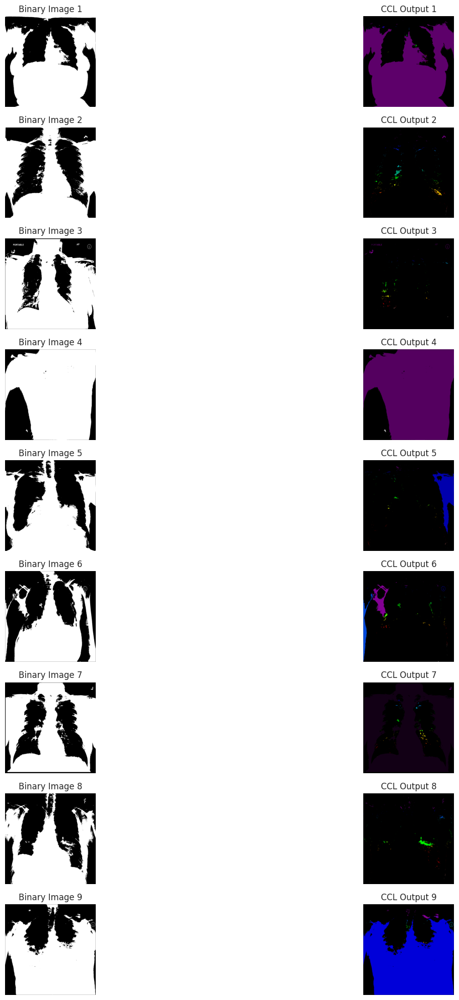

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))

# 9 rastgele seçilen görüntü üzerinde işlemler
for i in range(9):
    # Görüntüyü okuma ve gri tonlamaya çevirme
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img

    # Görüntü normalize edilerek uygun aralığa getiriliyor
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # İkili (binary) görüntü oluşturmak için Otsu eşikleme
    _, binary_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Connected Components Analysis (CCL) uygulama
    num_labels, labels_img = cv2.connectedComponents(binary_img)

    # Bağlantı bileşenlerinin sayısını yazdırma
    print(f"Image {i+1}: Detected {num_labels} connected components")

    # Görselleştirme
    plt.subplot(9, 2, 2 * i + 1)
    plt.imshow(binary_img, cmap='gray')
    plt.title(f"Binary Image {i+1}")
    plt.axis('off')

    plt.subplot(9, 2, 2 * i + 2)
    plt.imshow(labels_img, cmap='nipy_spectral')
    plt.title(f"CCL Output {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

Image 1: Connected Component Properties
{'Component ID': 1, 'Centroid': (9.885006195786865, 589.0143742255267), 'Area (pixels)': 16140.0, 'Mean Intensity': 183.52565055762082, 'Eccentricity': 0.9993566349235599, 'Extent (Area/Bounding Box)': 0.28657670454545453}
{'Component ID': 2, 'Centroid': (29.0, 498.5), 'Area (pixels)': 2.0, 'Mean Intensity': 121.0, 'Eccentricity': 1.0, 'Extent (Area/Bounding Box)': 1.0}
{'Component ID': 3, 'Centroid': (31.666666666666668, 493.0), 'Area (pixels)': 3.0, 'Mean Intensity': 121.66666666666667, 'Eccentricity': 0.97372313034591, 'Extent (Area/Bounding Box)': 0.5}
{'Component ID': 4, 'Centroid': (32.0, 503.0), 'Area (pixels)': 1.0, 'Mean Intensity': 122.0, 'Eccentricity': 0, 'Extent (Area/Bounding Box)': 1.0}
{'Component ID': 5, 'Centroid': (35.0, 491.0), 'Area (pixels)': 1.0, 'Mean Intensity': 121.0, 'Eccentricity': 0, 'Extent (Area/Bounding Box)': 1.0}
{'Component ID': 6, 'Centroid': (38.0, 489.0), 'Area (pixels)': 1.0, 'Mean Intensity': 121.0, 'Eccent

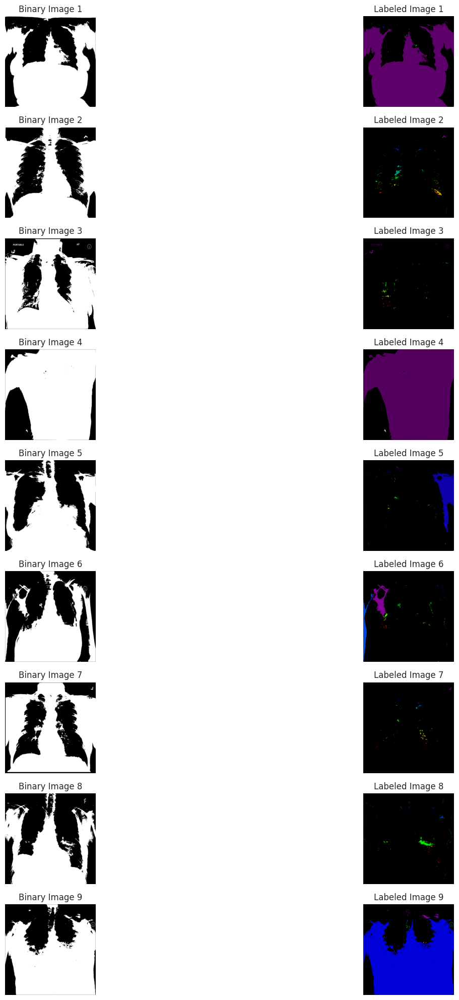

In [16]:
from skimage import measure
import matplotlib.pyplot as plt
import pandas as pd

plt.figure(figsize=(20, 20))

# 9 rastgele seçilen görüntü üzerinde işlemler
for i in range(9):
    # Görüntüyü okuma ve gri tonlamaya çevirme
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img

    # Görüntü normalize edilerek uygun aralığa getiriliyor
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # İkili (binary) görüntü oluşturmak için Otsu eşikleme
    _, binary_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Bağlantı bileşen analizi (CCL)
    labeled_img = measure.label(binary_img, connectivity=2, background=0)

    # Regionprops ile öznitelik çıkarma
    regions = measure.regionprops(labeled_img, intensity_image=img_gray)

    # Özniteliklerden bazılarını seçiyoruz: area, centroid, mean_intensity, eccentricity, extent
    print(f"Image {i+1}: Connected Component Properties")
    for region_idx, region in enumerate(regions):
        props = {
            "Component ID": region_idx + 1,
            "Centroid": region.centroid,
            "Area (pixels)": region.area,
            "Mean Intensity": region.mean_intensity,
            "Eccentricity": region.eccentricity,
            "Extent (Area/Bounding Box)": region.extent,
        }
        print(props)

    # Görselleştirme: Labeled Image
    plt.subplot(9, 2, 2 * i + 1)
    plt.imshow(binary_img, cmap="gray")
    plt.title(f"Binary Image {i+1}")
    plt.axis("off")

    plt.subplot(9, 2, 2 * i + 2)
    plt.imshow(labeled_img, cmap="nipy_spectral")
    plt.title(f"Labeled Image {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

Image 1 Selected Regions:
    index      Area                                  Centroid  Eccentricity  \
0     13  604901.0    (620.7240027707013, 512.9259730104595)      0.430601   
1      0   16140.0    (9.885006195786865, 589.0143742255267)      0.999357   
2     48     303.0  (123.35643564356435, 226.91749174917493)      0.790632   

     Extent  Mean Intensity  
0  0.622470      180.178507  
1  0.286577      183.525651  
2  0.407258      129.495050  
Image 2 Selected Regions:
    index      Area                                 Centroid  Eccentricity  \
0      0  581868.0   (593.6367681329787, 509.7130809736916)      0.291748   
1    340    1702.0  (513.1827262044653, 386.26439482961223)      0.905854   

     Extent  Mean Intensity  
0  0.554913      132.994088  
1  0.307776      111.216216  
Image 3 Selected Regions:
    index      Area                                 Centroid  Eccentricity  \
0      0  708338.0   (601.9510219697377, 505.5689190753567)      0.386258   
1     22  

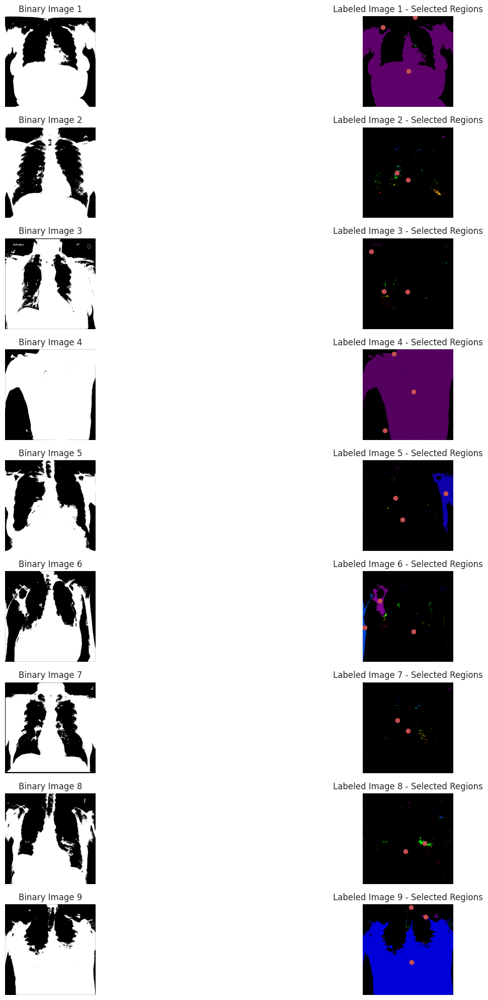

In [17]:
from skimage import measure
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

plt.figure(figsize=(20, 20))

# 9 rastgele seçilen görüntü üzerinde işlemler
for i in range(9):
    # Görüntüyü okuma ve gri tonlamaya çevirme
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img

    # Görüntüyü normalize et
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # İkili (binary) görüntü oluşturmak için Otsu eşikleme
    _, binary_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Bağlantı bileşen analizi (CCL)
    labeled_img, num_labels = measure.label(binary_img, connectivity=2, background=0, return_num=True)

    # Öznitelikleri çıkar (regionprops kullanımı)
    regions = measure.regionprops(labeled_img, intensity_image=img_gray)

    # Özniteliklerden DataFrame oluştur
    region_data = []
    for region in regions:
        region_data.append({
            "Area": region.area,
            "Centroid": region.centroid,
            "Eccentricity": region.eccentricity,
            "Extent": region.extent,
            "Mean Intensity": region.mean_intensity
        })

    # DataFrame ile sıralama ve filtreleme
    df = pd.DataFrame(region_data).sort_values(by="Area", ascending=False).reset_index()

    # İlk iki büyük bölgeyi seç
    filtered_regions = df.iloc[:2]

    # Filtreleme kriterleri
    center_x, center_y = img_gray.shape[1] // 2, img_gray.shape[0] // 2
    if all((abs(region["Centroid"][0] - center_y) < center_y // 2) and
           (abs(region["Centroid"][1] - center_x) < center_x // 2)
           for _, region in filtered_regions.iterrows()):
        selected_regions = filtered_regions
    else:
        # Eğer kriter sağlanmazsa üçüncü bölgeyi dene
        if len(df) > 2:
            selected_regions = df.iloc[:3]
        else:
            selected_regions = df

    # Sonuçları görselleştir
    plt.subplot(9, 2, 2 * i + 1)
    plt.imshow(binary_img, cmap="gray")
    plt.title(f"Binary Image {i+1}")
    plt.axis("off")

    plt.subplot(9, 2, 2 * i + 2)
    plt.imshow(labeled_img, cmap="nipy_spectral")
    for _, region in selected_regions.iterrows():
        plt.plot(region["Centroid"][1], region["Centroid"][0], 'ro')
    plt.title(f"Labeled Image {i+1} - Selected Regions")
    plt.axis("off")

    print(f"Image {i+1} Selected Regions:\n", selected_regions)

plt.tight_layout()
plt.show()

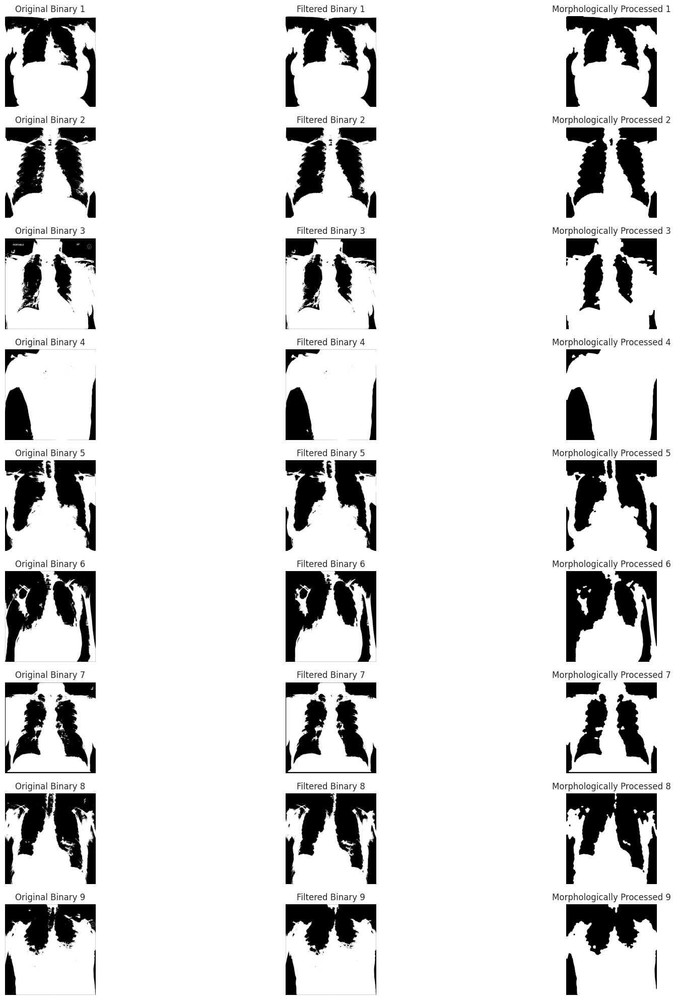

In [18]:
import cv2
import numpy as np
from skimage import measure
import matplotlib.pyplot as plt
import os

plt.figure(figsize=(20, 20))

# Görüntü işlemi: 9 rastgele seçilen görüntü üzerinde çalışıyoruz
for i in range(9):
    # Görüntüyü okuma ve gri tonlamaya çevirme
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img

    # Görüntüyü normalize et
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # İkili görüntü (binary) oluşturmak için Otsu eşikleme
    _, binary_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Bağlantı bileşen analizi
    labeled_img, num_labels = measure.label(binary_img, connectivity=2, background=0, return_num=True)

    # Bölgelere ait özellikleri çıkar (regionprops)
    regions = measure.regionprops(labeled_img, intensity_image=img_gray)

    # En büyük iki bölgeyi seç
    regions_sorted = sorted(regions, key=lambda x: x.area, reverse=True)[:2]

    # Seçilen etiketlere göre filtrelenmiş ikili görüntü oluştur
    filtered_binary = np.zeros_like(binary_img)
    for region in regions_sorted:
        filtered_binary[labeled_img == region.label] = 255

    # Morfolojik işlemler için structural element oluştur
    kernel_size = (15, 15)  # Uygun boyut (görüntünün ölçeğine göre ayarlanabilir)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)

    # Morfolojik işlemler
    opened_img = cv2.morphologyEx(filtered_binary, cv2.MORPH_OPEN, kernel)  # Gürültü temizleme
    closed_img = cv2.morphologyEx(opened_img, cv2.MORPH_CLOSE, kernel)      # Sınırları düzeltme

    # Görselleştirme: Giriş ve Çıkış Görüntüleri
    plt.subplot(9, 3, 3 * i + 1)
    plt.imshow(binary_img, cmap="gray")
    plt.title(f"Original Binary {i+1}")
    plt.axis("off")

    plt.subplot(9, 3, 3 * i + 2)
    plt.imshow(filtered_binary, cmap="gray")
    plt.title(f"Filtered Binary {i+1}")
    plt.axis("off")

    plt.subplot(9, 3, 3 * i + 3)
    plt.imshow(closed_img, cmap="gray")
    plt.title(f"Morphologically Processed {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

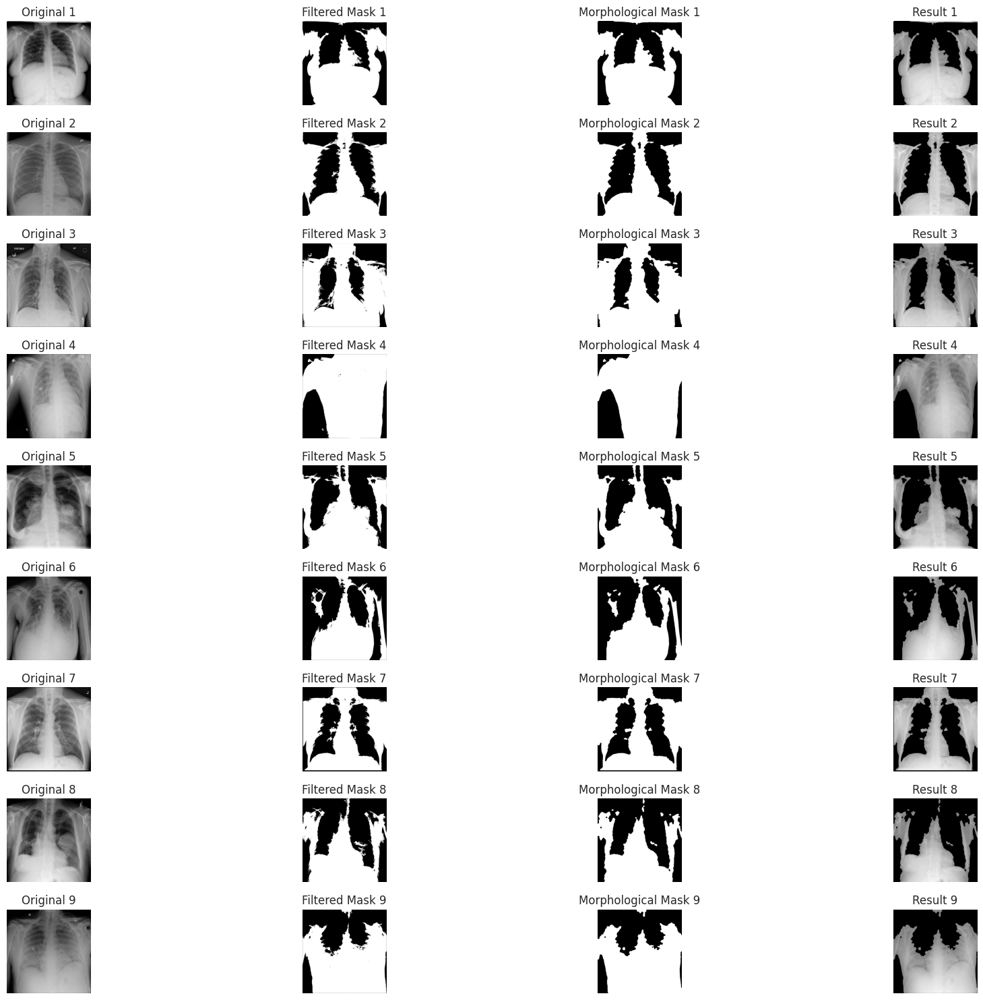

In [19]:
plt.figure(figsize=(20, 15))

for i in range(9):
    # Orijinal görüntü
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = img

    # Görüntüyü normalize et
    img_gray = cv2.normalize(img_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Otsu eşikleme ve binary görüntü
    _, binary_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Bağlantı bileşen analizi ve regionprops ile en büyük iki bölgeyi seç
    labeled_img, num_labels = measure.label(binary_img, connectivity=2, background=0, return_num=True)
    regions = measure.regionprops(labeled_img, intensity_image=img_gray)
    regions_sorted = sorted(regions, key=lambda x: x.area, reverse=True)[:2]

    # Seçilen etiketlere göre filtreleme
    filtered_binary = np.zeros_like(binary_img)
    for region in regions_sorted:
        filtered_binary[labeled_img == region.label] = 255

    # Morfolojik işlemler
    kernel_size = (15, 15)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    opened_img = cv2.morphologyEx(filtered_binary, cv2.MORPH_OPEN, kernel)
    closed_img = cv2.morphologyEx(opened_img, cv2.MORPH_CLOSE, kernel)

    # Maskeyi orijinal görüntüye uygula (piksel çarpımı)
    result_img = cv2.bitwise_and(img_gray, img_gray, mask=closed_img.astype(np.uint8))

    # Görselleştirme
    plt.subplot(9, 4, 4 * i + 1)
    plt.imshow(img_gray, cmap="gray")
    plt.title(f"Original {i+1}")
    plt.axis("off")

    plt.subplot(9, 4, 4 * i + 2)
    plt.imshow(filtered_binary, cmap="gray")
    plt.title(f"Filtered Mask {i+1}")
    plt.axis("off")

    plt.subplot(9, 4, 4 * i + 3)
    plt.imshow(closed_img, cmap="gray")
    plt.title(f"Morphological Mask {i+1}")
    plt.axis("off")

    plt.subplot(9, 4, 4 * i + 4)
    plt.imshow(result_img, cmap="gray")
    plt.title(f"Result {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()